# Estimation de cartes de hauteurs par adaption de l'algorithme PatchMatch.

Projet réalisé par Valéry DEWIL et Juliette RENGOT dans le cadre du cours "Remote sensing data: from sensor to large-scale geospatial data exploitation" du master MVA.

## Les modules à importer

In [1]:
## modules de python
import scipy
import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg as sli
import utm
import srtm4

from mpl_toolkits.mplot3d import Axes3D
from scipy.signal import convolve2d
from numba import jit

plt.ion()
plt.show()
%matplotlib nbagg

%load_ext autoreload
%autoreload 2

In [2]:
## fichiers ajoutés
#import ipytools
import utils
import stereo
import rectification
import vistools

## Les données à définir

### Données "utilisateur"

Les images originales disponibles



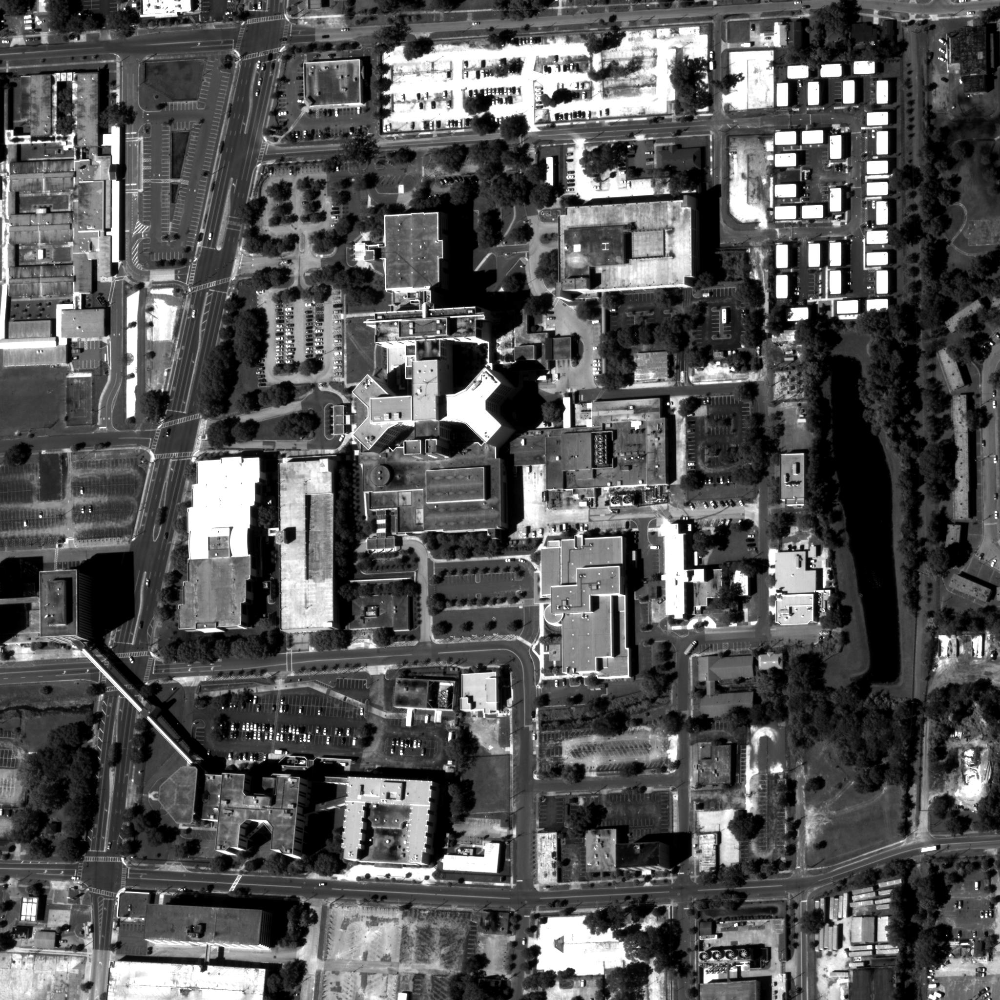
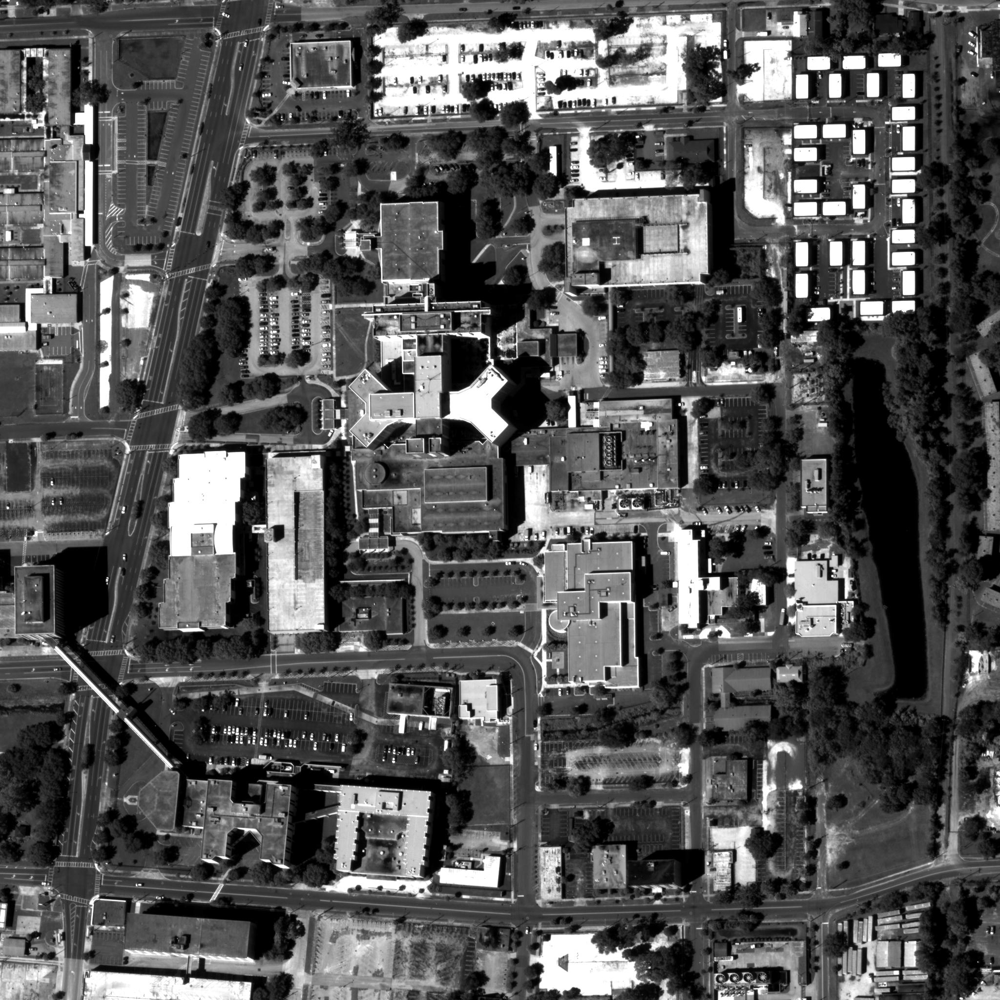
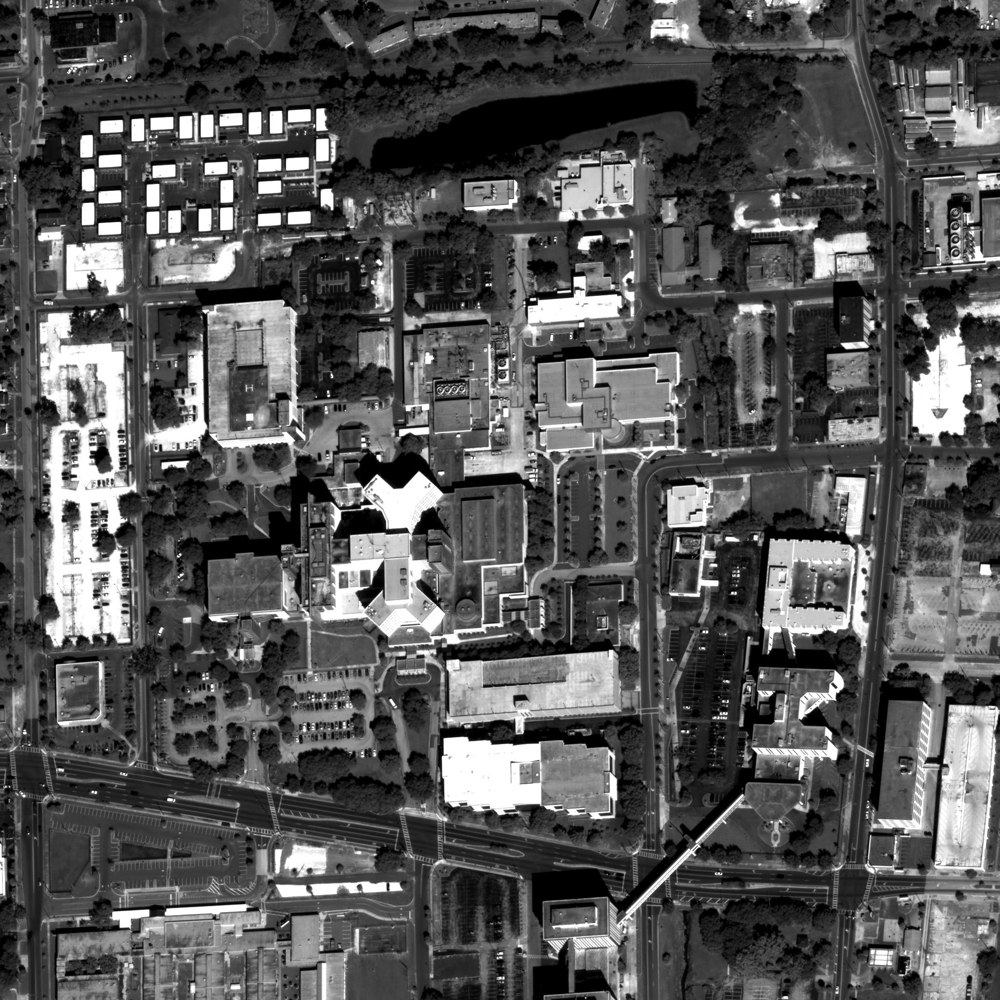
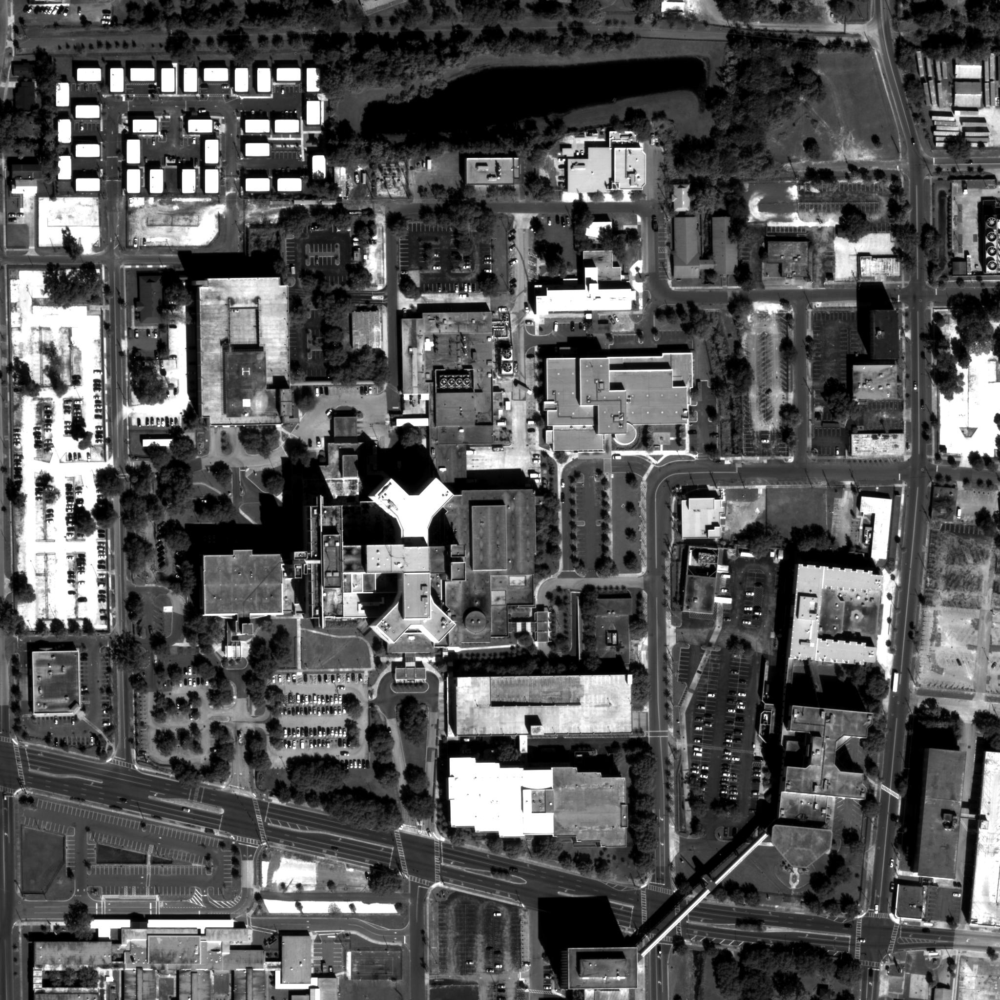
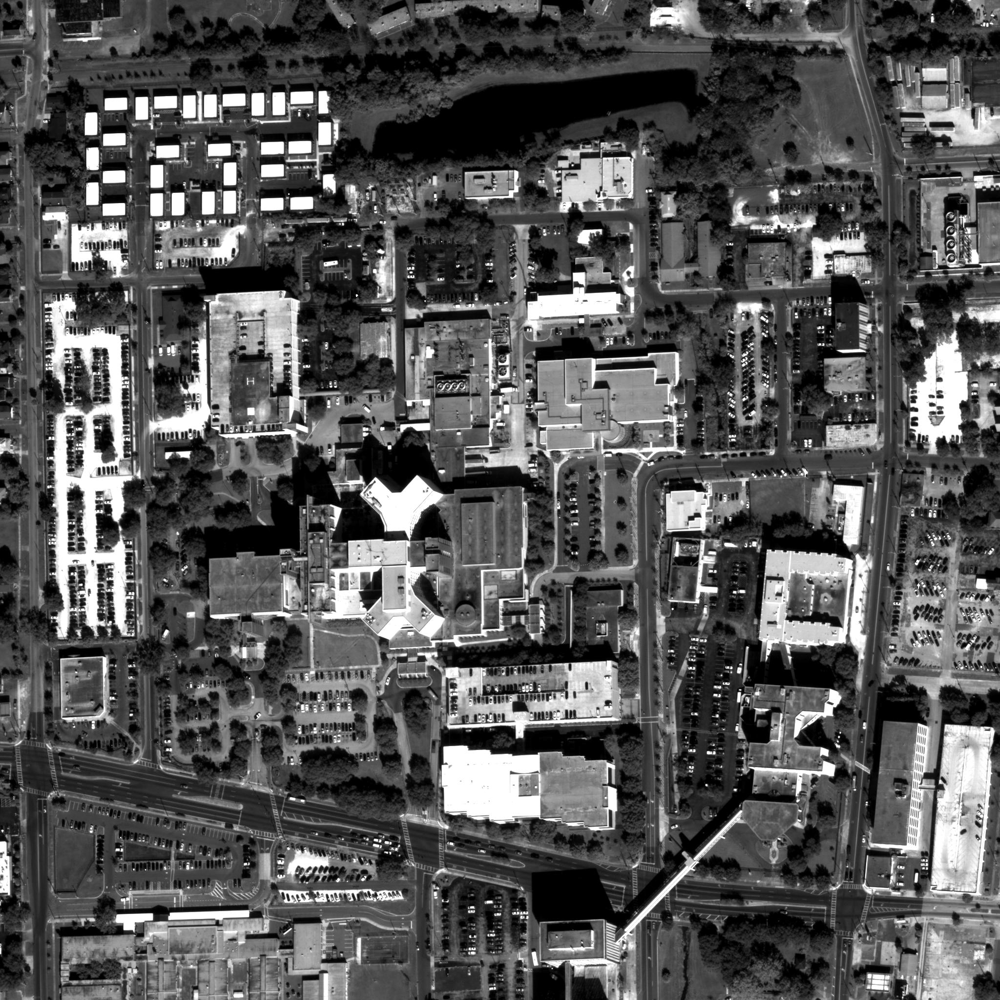
...
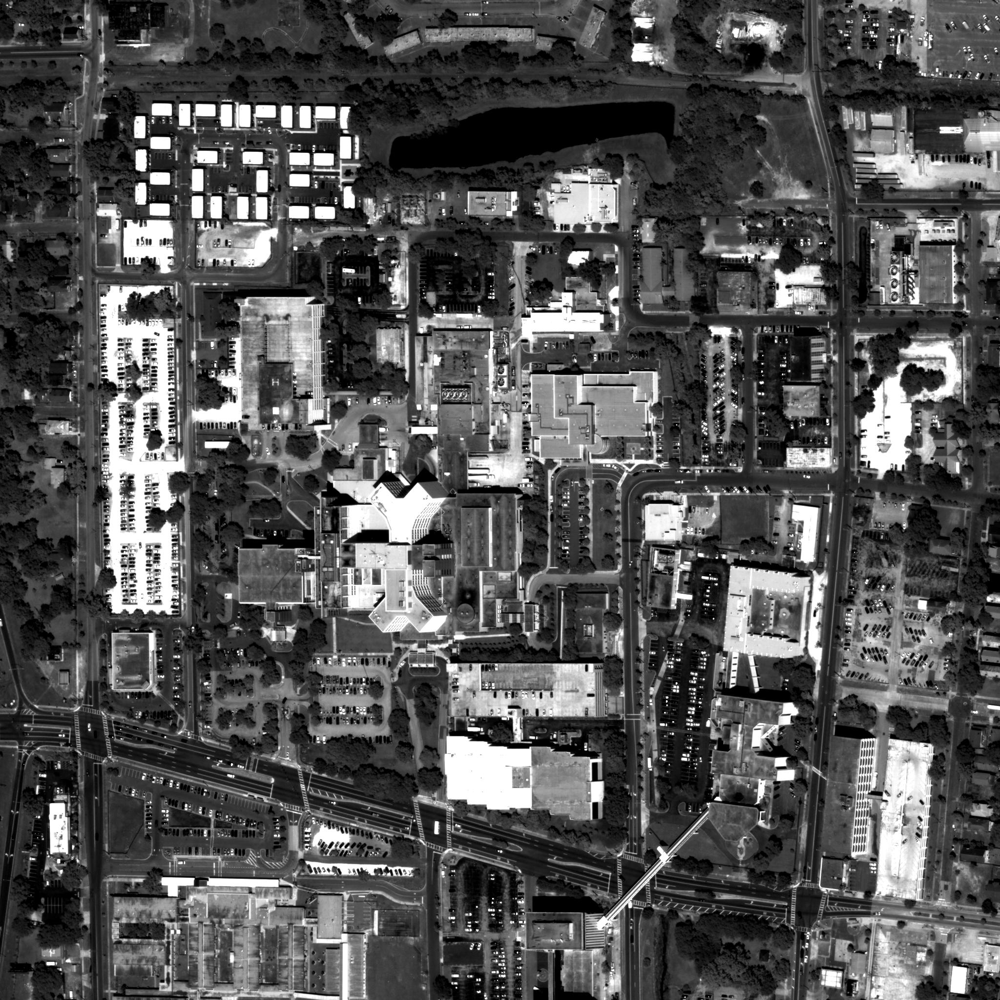
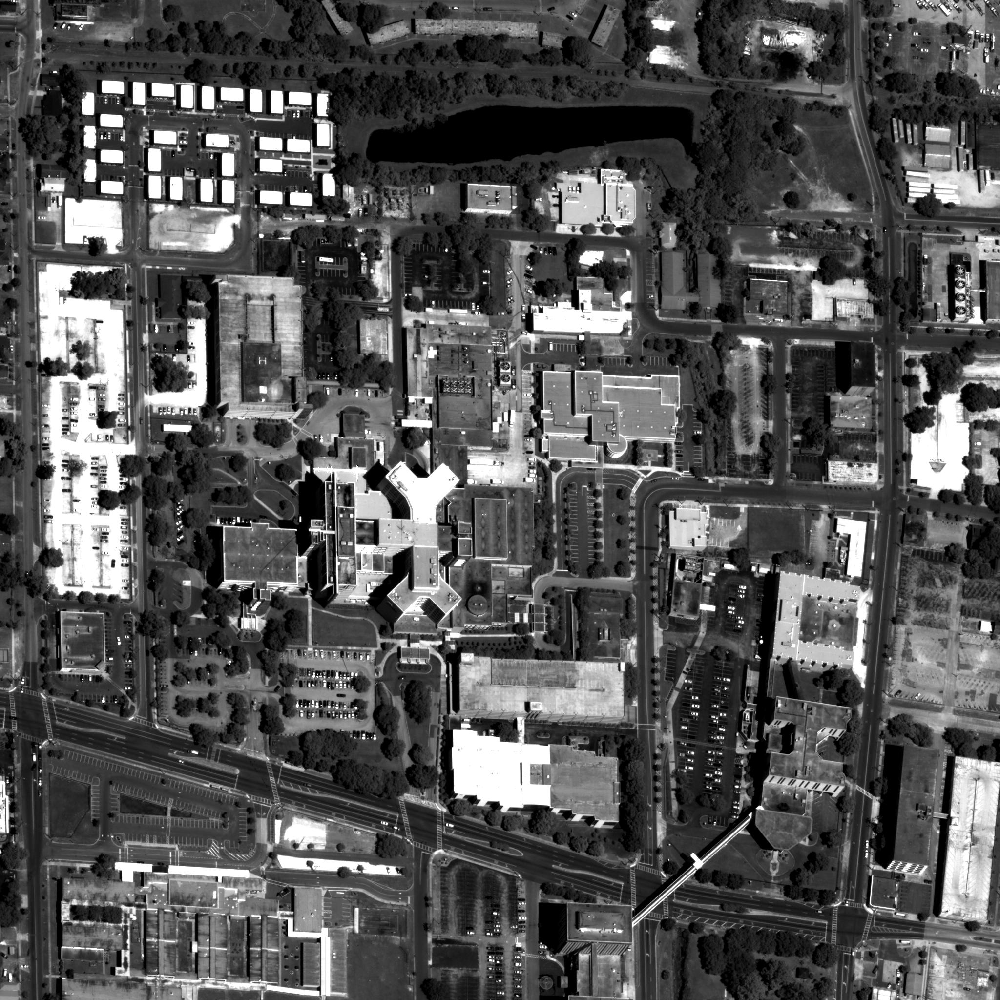
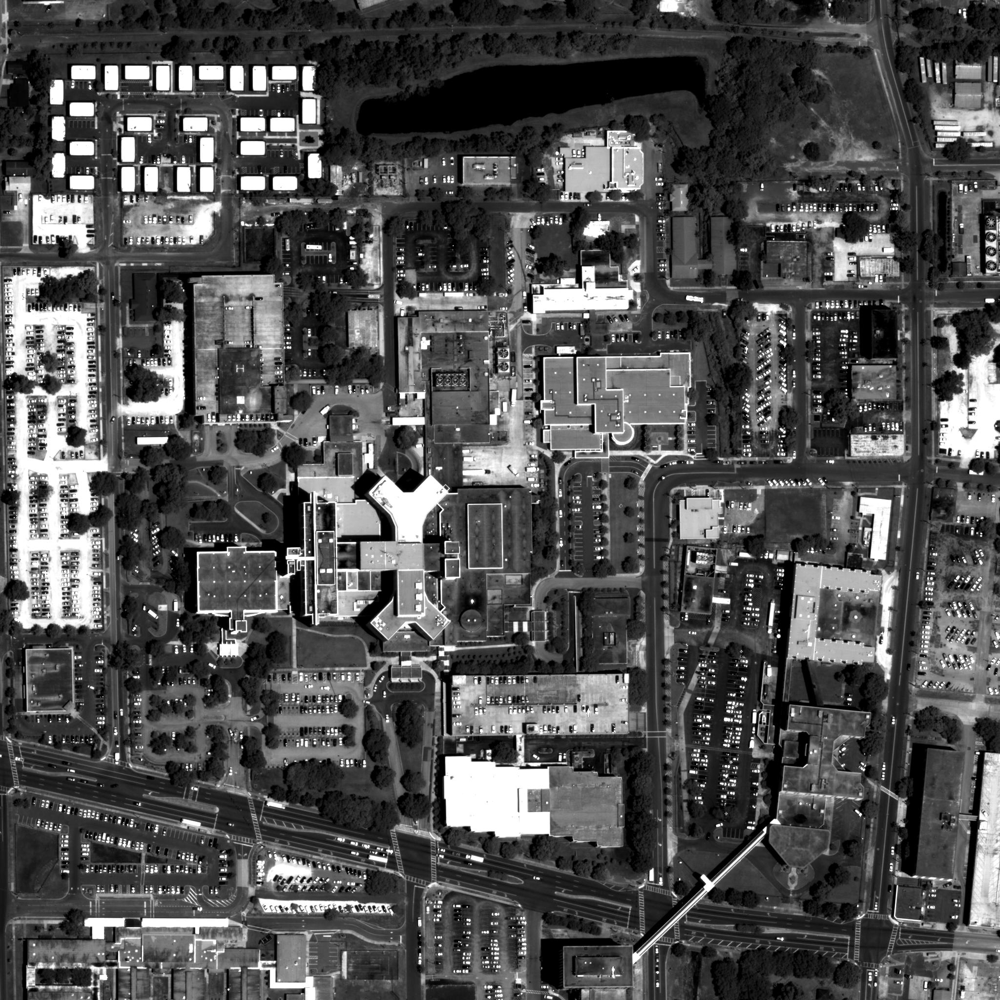
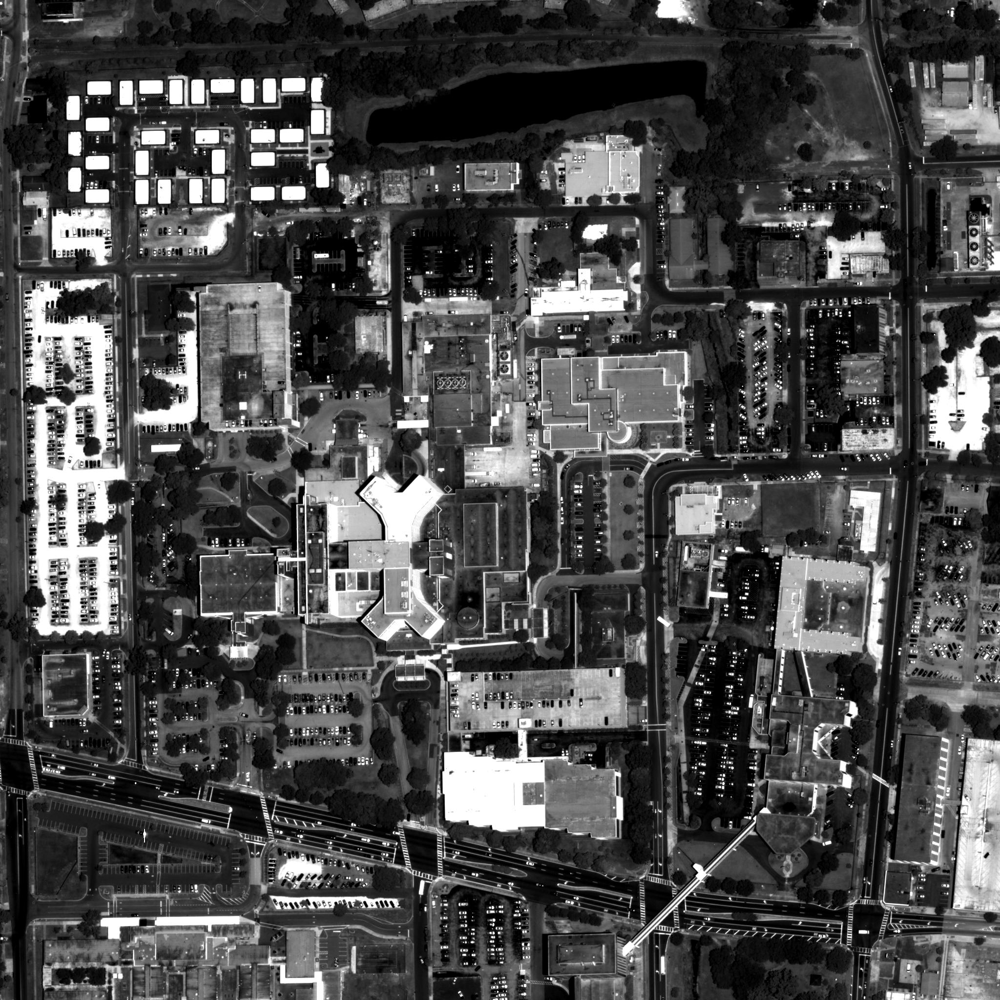
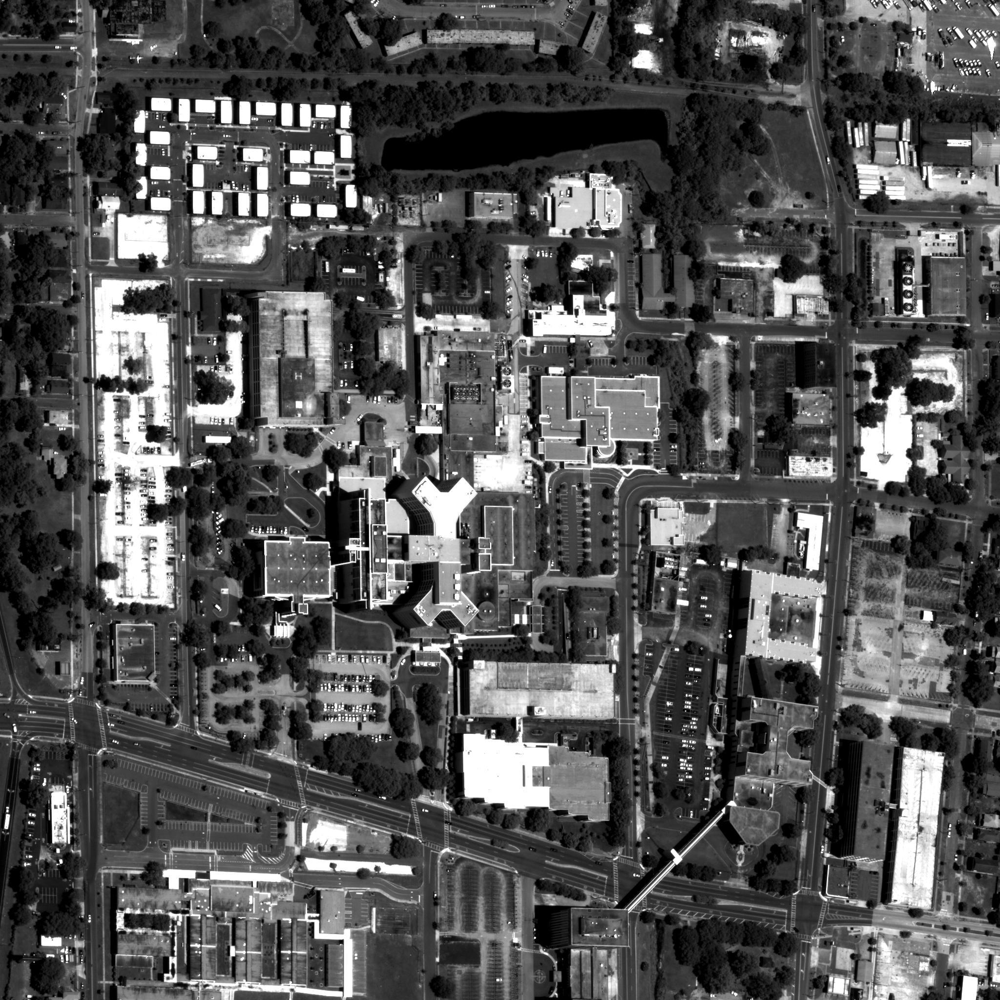

In [3]:
# Telechargement des images 
images = utils.find('http://138.231.80.166:2334/grss-2019/track_3/Track3-MSI-1/', extension='PAN.tif')
images = images[83:101]
#images = images.sort(key=utils.acquisition_date) # Deja triée
#NB : les images 0/1 et les images 9/10 sont prises à des dates identiques

# Affichage des images
print('Les images originales disponibles')
vistools.display_gallery([utils.simple_equalization_8bit(utils.readGTIFF(x)) for x in images])

In [5]:
# Choix des images
indice_images = [5, 6, 10, 11, 2, 4, 3,5,15,16, 12, 13] #multi-vues
#indice_images = [5, 6] #mono-vue

liste_images = []
liste_noms = []
for idx in indice_images :
    # Chargement des images choisies
    liste_images.append(utils.readGTIFF(images[idx]))
    liste_noms.append(images[idx])

In [ ]:
#crop images
a, b, c, d = 200, 1100, 600, 1500

#itérations, census
patch_size = 7 #penser que les patch sont 2*patch_size + 1

#seuil pour le critère d'arrêt
nb_iterations = 30
taux_arret_PM = 0.001 #au bout de combien de pixels (en ratio de la grille) encore modifiés on arrête le patch match (valeur raisonnable : 1%)

#seuillage des points à valeur de coût trop élevée
seuil_cout = 50 

### Données "programme"

In [6]:
N = c-a #  taille de l'image rognée
M = d-b

n = N # taille de la grille
m = M 

#seuil arrêt PM en fonction du pourcentage donné plus haut (pourcentage fois la taille de la grille)
seuil_arret_PM = taux_arret_PM * n * m

lonlat= False # True  : grille en lon/lat
              # False : grille en easting northing

## Les fonctions

In [7]:
@jit
def produit_scalaire(RPC_affine, lon, lat, haut):
    [a, b, c, d] = RPC_affine[0, :]
    [e, j, g, h] = RPC_affine[1, :]
    
    return(a*lon + b*lat + c*haut + d, e*lon + j*lat + g*haut + h)

In [8]:
@jit
def cout(im1, RPC1, im2, RPC2, lon, lat, h):     
    """
    Cette fonction définit la fonction de coût pour une hauteur h
    au point de la grille (lon, lat) donnée en coordonnées longitude/latitude
    On prend le même coût que dans le PatchMatch classique.
    RPC1, RPC2 sont les matrices de l'approximation de la projection affine dans l'image 1 et 2 composée avec la rectif.
    """      
    j1, i1  = produit_scalaire(RPC1, lon, lat, h)
    j1, i1 = np.int(np.round(j1)), np.int(np.round(i1))
    j2, i2 = produit_scalaire(RPC2, lon, lat, h)
    j2, i2 = np.int(np.round(j2)), np.int(np.round(i2))

    if i1 < im1.shape[0] and j1 < im1.shape[1] and i2 < im2.shape[0] and j2 < im2.shape[1] :
        c = stereo.computeHamming(im1, im2, i1, j1, i2, j2)    
    else :
        c = np.inf
    return c

In [9]:
@jit
def calcule_carte_de_couts(im1, RPC1, im2, RPC2, carte_de_hauteur, coord1_list, coord2_list, zone_number, zone_letter, rect_im1_avant=None, rect_im2_avant=None):
    """
    Cette fonction calcule une carte de couts associées à une carte de hauteurs. Elle renvoie aussi les images ortho rectifiées.
    RPC1, RPC2 sont les matrices de projection affine composées avec les rectifications respectives.
    
    """
    n, m = carte_de_hauteur.shape
    carte_de_couts = np.zeros((n, m))
    ortho = carte_de_hauteur*0
    ortho2 = carte_de_hauteur*0
    
    for i in range(n):
        for j in range(m):            
            if type(zone_number)==type(None) and type(zone_letter)==type(None): # Longitude / Latitude system
                lon = coord1_list[i]
                lat = coord2_list[j]
            else : # Easting / Northing system
                east = coord1_list[i]
                north = coord2_list[j]
                lat, lon = utm.to_latlon(east, north, zone_number, zone_letter)
                
            carte_de_couts[j, i] = cout(im1, RPC1, im2, RPC2, lon, lat, carte_de_hauteur[j, i])


            j1, i1 = produit_scalaire(RPC1, lon, lat, carte_de_hauteur[j, i])
            N,M = rect_im1_avant.shape
            if i1 >=0 and j1>=0 and i1< N and j1<M :
                ortho[j, i] = rect_im1_avant[np.int(i1),np.int(j1)] 

            j2, i2 = produit_scalaire(RPC2, lon, lat, carte_de_hauteur[j, i])
            N,M = rect_im2_avant.shape
            if i2 >=0 and j2>=0 and i2< N and j2<M :
                ortho2[j, i] = rect_im2_avant[np.int(i2),np.int(j2)] 
            
    return carte_de_couts, ortho, ortho2

In [10]:
@jit
def patch_match_hauteur(im1, RPC1, im2, RPC2,
                        carte_haut, carte_des_couts, carte_alea,
                        coord1_list, coord2_list, zone_number, zone_letter,
                        sens_direct=True, rect_im1_avant=None, rect_im2_avant=None):
    """
    Cette fonction applique le PM a une paire d'image : elle prend en arguments un couple de cartes haut / coûts, 
    les met à jour et les renvoie. Elle renvoie aussi les images orthorectifiées.
    """
    compteur = 0
    n, m = carte_haut.shape
    ortho = carte_haut.copy()
    ortho2 = carte_haut.copy()

    if sens_direct :
        for i in range(1, n-1): # on parcourt chaque element de la grille de haut en bas et de droite à gauche
            lon = Longitudes[i]
            for j in range(1, m-1):
                lat = Latitudes[j]

                haut_nouvelle_alea_gauss = carte_alea[j, i] # hauteur aleatoire                
                haut_nouvelle_alea_unif  = np.random.rand()*20  - 30
                #On regarde le voisin du dessous et de droite
                haut_voisin_droite = carte_haut[j-1, i]
                haut_voisin_dessous = carte_haut[j, i-1]

                #on calcule les couts associés à ces hauteurs :
                cout_alea_gauss = cout(im1, RPC1, im2, RPC2, lon, lat, haut_nouvelle_alea_gauss)
                cout_alea_unif = cout(im1, RPC1, im2, RPC2, lon, lat,haut_nouvelle_alea_unif)
                cout_voisin_droite  = cout(im1, RPC1, im2, RPC2, lon, lat, haut_voisin_droite)
                cout_voisin_dessous = cout(im1, RPC1, im2, RPC2, lon, lat, haut_voisin_dessous)

                #on regarde le cout min des deux aléa
                cout_alea, haut_nouvelle_alea = cout_alea_gauss, haut_nouvelle_alea_gauss
                if cout_alea_unif < cout_alea_gauss:
                    cout_alea = cout_alea_unif
                    haut_nouvelle_alea = haut_nouvelle_alea_unif

                #on regarde le coût minimum ainsi que la hauteur qui est argmin:
                cout_min = cout_alea
                haut_argmin =  haut_nouvelle_alea
                if cout_voisin_droite < cout_min or cout_voisin_dessous < cout_min:
                    if cout_voisin_dessous < cout_voisin_droite:
                        cout_min = cout_voisin_dessous
                        haut_argmin = haut_voisin_dessous
                    else:
                        cout_min = cout_voisin_droite
                        haut_argmin = haut_voisin_droite

                #on compare au cout actuel :

                if cout_min < carte_des_couts[j, i]:
                    #si le mini est plus petit, on met à jour la carte de hauteur et la carte des coûts :
                    carte_des_couts[j, i] = cout_min
                    carte_haut[j, i] = haut_argmin             
                    compteur = compteur + 1
                    
                j1, i1 = produit_scalaire(RPC1, lon, lat, haut_argmin)
                N,M = rect_im1_avant.shape
                if i1 >=0 and j1>=0 and i1< N and j1<M :
                    ortho[j,i] = rect_im1_avant[np.int(i1),np.int(j1)] 
                    
                j2, i2 = produit_scalaire(RPC2, lon, lat, haut_argmin)
                N,M = rect_im2_avant.shape
                if i2 >=0 and j2>=0 and i2< N and j2<M :
                    ortho2[j,i] = rect_im2_avant[np.int(i2),np.int(j2)] 
    else :
        for i in range(n-2, -1, -1): # on parcourt chaque element de la grille de bas en haut et de gauche à droite
            lon = Longitudes[i]
            for j in range(m-2, -1, -1):                         
                lat = Latitudes[j]

                haut_nouvelle_alea_gauss  = carte_alea[j, i] # hauteur aleatoire                
                haut_nouvelle_alea_unif = np.random.rand()*20-30
                #On regarde le voisin du dessus et de gauche
                haut_voisin_gauche = carte_haut[j+1, i]
                haut_voisin_dessus = carte_haut[j, i+1]

                #on calcule les couts associés à ces hauteurs :
                cout_alea_gauss = cout(im1, RPC1, im2, RPC2, lon, lat, haut_nouvelle_alea_gauss)
                cout_alea_unif = cout(im1, RPC1, im2, RPC2, lon, lat, haut_nouvelle_alea_unif)
                cout_voisin_gauche = cout(im1, RPC1, im2, RPC2, lon, lat, haut_voisin_gauche)
                cout_voisin_dessus = cout(im1, RPC1, im2, RPC2, lon, lat, haut_voisin_dessus)

                #on regarde le cout min des deux aléa
                cout_alea, haut_nouvelle_alea = cout_alea_gauss, haut_nouvelle_alea_gauss
                if cout_alea_unif < cout_alea_gauss:
                    cout_alea = cout_alea_unif
                    haut_nouvelle_alea = haut_nouvelle_alea_unif

                #on regarde le coût minimum ainsi que la hauteur qui est argmin:
                cout_min = cout_alea
                haut_argmin =  haut_nouvelle_alea
                if cout_voisin_gauche < cout_min or cout_voisin_dessus < cout_min:
                    if cout_voisin_dessus < cout_voisin_gauche:
                        cout_min = cout_voisin_dessus
                        haut_argmin = haut_voisin_dessus
                    else:
                        cout_min = cout_voisin_gauche
                        haut_argmin = haut_voisin_gauche

                #on compare au cout actuel :
                if cout_min < carte_des_couts[j, i]:
                    #si le mini est plus petit, on met à jour la carte de hauteur et la carte des coûts :
                    carte_des_couts[j, i] = cout_min
                    carte_haut[j, i] = haut_argmin             
                    compteur = compteur + 1 
                    
                j1, i1 = produit_scalaire(RPC1, lon, lat, haut_argmin)
                N,M = rect_im1_avant.shape
                if i1 >=0 and j1>=0 and i1< N and j1<M :
                    ortho[j,i] = rect_im1_avant[np.int(i1),np.int(j1)] 
                    
                j2, i2 = produit_scalaire(RPC2, lon, lat, haut_argmin)
                N,M = rect_im2_avant.shape
                if i2 >=0 and j2>=0 and i2< N and j2<M :
                    ortho2[j,i] = rect_im2_avant[np.int(i2),np.int(j2)] 
                    
    return compteur, carte_haut, carte_des_couts, ortho, ortho2

In [11]:
@jit
def rectif_pair(file1, file2, aoi, plot=True):
    """
    Rectifier les images
    On obtient les images rectifiées rect_im1, rect_im2 
    # S1, S2 les matrices de transformation depuis le systeme de coordoonées des images originales
    # disp_min, disp_max l'intervalle de disparité horizontale
    # P1, P2 les approximations affines des rpc
    """
    
    rect_im1, rect_im2, S1, S2, disp_min, disp_max, P1, P2 = rectification.rectify_aoi(file1, file2, aoi, correct_pointing=True)
    if plot :
        # display the rectifies crops
        vistools.display_gallery([utils.simple_equalization_8bit(rect_im1),
                                  utils.simple_equalization_8bit(rect_im2)])
    return(rect_im1, rect_im2, S1, S2, disp_min, disp_max, P1, P2)

In [12]:
def patchmatch_paire(file1, file2,
                     aoi,
                     n, m,
                     h_min, h_max,
                     Longitudes, Latitudes, lonlat=True,
                     version = 3,
                     plot = False):
    """
    C'est la fonction principale qui a deux fichiers renvoie l'estimation de hauteur
    """
    ### EASTING / NORTHING ###
    if not lonlat :
        east_mini, north_mini, zone_number, zone_letter = utm.from_latlon(np.min(Latitudes), np.min(Longitudes))
        east_maxi, north_maxi, _, _ = utm.from_latlon(np.max(Latitudes), np.max(Longitudes))

        Eastings = np.arange(start = east_mini,
                             stop  = east_maxi,
                             step  = (east_maxi-east_mini)/n)

        Northings = np.arange(start = north_mini,
                              stop  = north_maxi,
                              step  = (north_maxi-north_mini)/m)
        
        if plot :
            print('Eastings', Eastings)
            print('Northings', Northings)
        
    #Images
   
    #Rectification
    rect_im1, rect_im2, S1, S2, disp_min, disp_max, P1, P2 = rectif_pair(file1, file2, aoi, plot)
    rect_im1_avant = rect_im1.copy()
    rect_im2_avant = rect_im2.copy()
    
    rect_im1 = stereo.censustransform(rect_im1, 2*patch_size+1)
    rect_im2 = stereo.censustransform(rect_im2, 2*patch_size+1)

    if rect_im1.ndim == 2: # Les images doivent avoir trois dimensions pour être utilisées par la fonction computeHamming
        rect_im1 = np.expand_dims(rect_im1, 2)
    if rect_im2.ndim == 2:
        rect_im2 = np.expand_dims(rect_im2, 2)

    M1, M2 = S1.dot(P1), S2.dot(P2)
    
    #INITIALISATION
    carte_hauteur = np.random.rand(n, m)*(h_max-h_min) + h_min

    if lonlat :
        carte_couts, ortho1, ortho2 = calcule_carte_de_couts(rect_im1, M1,
                                             rect_im2, M2,
                                             carte_hauteur,
                                             Longitudes, Latitudes, None, None, rect_im1_avant, rect_im2_avant)
    else:
        carte_couts, ortho1, ortho2 = calcule_carte_de_couts(rect_im1, M1,
                                             rect_im2, M2,
                                             carte_hauteur,
                                             Eastings, Northings, zone_number, zone_letter, rect_im1_avant, rect_im2_avant)

    if plot :
        plt.figure()
        plt.imshow(carte_couts, cmap = plt.cm.jet)      
        plt.colorbar()
        plt.title('Carte de couts initiale')
        plt.show()
        
        plt.figure()
        plt.imshow(carte_hauteur, cmap = plt.cm.jet)      
        plt.colorbar()
        plt.title('Carte de hauteurs initiale')
        plt.show()

    iteration = 0
    compteur = seuil_arret_PM + 1
    while iteration < nb_iterations and compteur > seuil_arret_PM:

        #carte de hauteur aléatoire:
        carte_haut_alea = np.random.rand(n, m)*(h_max-h_min) + h_min 
    
        if lonlat :
            compteur, carte_hauteur, carte_couts, ortho1, ortho2 = patch_match_hauteur(rect_im1, M1, rect_im2, M2,
                                                                       carte_hauteur, carte_couts, carte_haut_alea,
                                                                       Longitudes, Latitudes, None, None,
                                                                        True, rect_im1_avant, rect_im2_avant)
            
            compteur, carte_hauteur, carte_couts, ortho1, ortho2 = patch_match_hauteur(rect_im1, M1, rect_im2, M2,
                                                                       carte_hauteur, carte_couts, carte_haut_alea,
                                                                       Longitudes, Latitudes, None, None,
                                                                       False, rect_im1_avant, rect_im2_avant)
        else :
            compteur, carte_hauteur, carte_couts, ortho1, ortho2 = patch_match_hauteur(rect_im1, M1, rect_im2, M2,
                                                                       carte_hauteur, carte_couts, carte_haut_alea,
                                                                       Eastings, Northings, zone_number, zone_letter,
                                                                       True, rect_im1_avant, rect_im2_avant)
            compteur, carte_hauteur, carte_couts, ortho1, ortho2 = patch_match_hauteur(rect_im1, M1, rect_im2, M2,
                                                                       carte_hauteur, carte_couts, carte_haut_alea,
                                                                       Eastings, Northings, zone_number, zone_letter,
                                                                       False, rect_im1_avant, rect_im2_avant)

        iteration += 1
        print('Iteration : ' + str(iteration) + ' | compteur ' + str(compteur))
        if plot :
            plt.figure()
            plt.imshow(carte_couts, cmap = plt.cm.jet)      
            plt.colorbar()
            plt.title('Carte de couts')
            plt.show()

            plt.figure()
            plt.imshow(carte_hauteur, cmap = plt.cm.jet)      
            plt.colorbar()
            plt.title('Carte de hauteurs')
            plt.show()

    return(carte_hauteur, carte_couts, ortho1, ortho2)

In [13]:
def plot3d(carte_hauteur, elevation=90, azimuth=0):
    """
    Cette fonction prend en argument une carte de hauteur et éventuellement pour ceux qui voudrait voir la 3D 
    selon une visée particulière, on peut mettre une élévation et un azimuth. Elle trace le graphe 3D
    """
    n, m = carte_hauteur.shape
    X, Y = np.mgrid[0:n, 0:m]
    fig_nb = np.random.randint(100, 200)
    plt.close(fig_nb)
    fig = plt.figure(fig_nb)
    ax = fig.gca(projection='3d')
    ax.axis('off')
    ax.view_init(elev = elevation, azim = azimuth)
    #normalisation entre 0 et 1
    h_min = np.min(carte_hauteur)
    h_max = np.max(carte_hauteur)
    ax.plot_surface(X, Y, 1-(carte_hauteur-h_min)/(h_max-h_min), cmap = plt.cm.gray, rstride = 5, cstride = 5)


## Le programme

### Definition  des rpc et de l'aoi

In [67]:
# Modèle rpc des images choisies
rpc_ref = utils.rpc_from_geotiff(liste_noms[0])

#print(rpc_liste)

In [68]:
#Initialisation de la carte de hauteur
#NB rpc_liste[0] est le rpc de référence
lon1_corner1, lat1_corner1 = rpc_ref.localization(a, b, 0)
lon1_corner2, lat1_corner2 = rpc_ref.localization(c, d, 0)

if lon1_corner1 > lon1_corner2 :
    lon1_corner1, lon1_corner2 = lon1_corner2, lon1_corner1
if lat1_corner1 > lat1_corner2 :
    lat1_corner1, lat1_corner2 = lat1_corner2, lat1_corner1

lon_mini = lon1_corner1
lon_maxi = lon1_corner2
lat_mini = lat1_corner1
lat_maxi = lat1_corner2

In [69]:
map = vistools.clickablemap()

for fichier in liste_noms :
    footprint = utils.lon_lat_image_footprint(fichier)
    map.add_GeoJSON(footprint)
    
# center the map on the center of the last footprint
map.center = np.mean(footprint['coordinates'][0][:4], axis=0).tolist()[::-1]
display(map)

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

In [72]:
try:  #on récupère le dernier tracé sur la carte précédente s'il y en a un
    aoi = map.AOIs[-1]['geometry']

except IndexError:  # sinon aoi définie avec le crop
    aoi = {'coordinates': [[[lon_mini, lat_maxi],
                            [lon_maxi, lat_maxi],
                            [lon_maxi, lat_mini],
                            [lon_mini, lat_mini]]],
                          'type': 'Polygon'}
    
#print(aoi['coordinates'][0])

In [73]:
Latitudes = np.arange(start =  np.min(np.array(aoi['coordinates'])[0, :, 1]),
                      stop  =  np.max(np.array(aoi['coordinates'])[0, :, 1]),
                      step  = (np.max(np.array(aoi['coordinates'])[0, :, 1])-np.min(np.array(aoi['coordinates'])[0, :, 1]))/n)

Longitudes = np.arange(start =  np.min(np.array(aoi['coordinates'])[0, :, 0]),
                       stop  =  np.max(np.array(aoi['coordinates'])[0, :, 0]),
                       step  = (np.max(np.array(aoi['coordinates'])[0, :, 0])-np.min(np.array(aoi['coordinates'])[0, :, 0]))/m)

#print('Latitudes', Latitudes, np.max(Latitudes)-np.min(Latitudes))
#print('Longitudes', Longitudes, np.max(Longitudes)-np.min(Longitudes))

In [74]:
h_ref = srtm4.srtm4(Longitudes[0], Latitudes[0])
print('Hauteur de référence : ', h_ref)

h_min, h_max = h_ref-20, h_ref+20   # domaine de recherche des hauteurs

Hauteur de référence :  -20.6985


### PatchMatch multi-vues

In [75]:
#On fait le patchmatch paire par paire
carte_hauteur_liste = []
carte_couts_liste = []
ortho1_liste = []
ortho2_liste = []
for i in range(len(liste_noms)//2):   
    file1 = liste_noms[2*i]
    #rpc1 = rpc_liste[2*i]
    file2 = liste_noms[2*i+1]
    #rpc2 = rpc_liste[2*i+1]
    print('')
    print('Paire ' + str(i) + ' : '+ file1 + ' | '+ file2)
    
    carte_hauteur, carte_couts, ortho1, ortho2 = patchmatch_paire(file1, file2,
                                                  aoi,
                                                  n, m,
                                                  h_min, h_max,
                                                  Longitudes, Latitudes, lonlat,
                                                  False)
    carte_hauteur_liste.append(carte_hauteur)
    carte_couts_liste.append(carte_couts)
    ortho1_liste.append(ortho1)
    ortho2_liste.append(ortho2)


Paire 0 : http://138.231.80.166:2334/grss-2019/track_3/Track3-MSI-1/JAX_068_006_PAN.tif | http://138.231.80.166:2334/grss-2019/track_3/Track3-MSI-1/JAX_068_007_PAN.tif
Iteration : 1 | compteur 43290
Iteration : 2 | compteur 7388
Iteration : 3 | compteur 4203
Iteration : 4 | compteur 3060
Iteration : 5 | compteur 2288
Iteration : 6 | compteur 1840
Iteration : 7 | compteur 1475
Iteration : 8 | compteur 1280
Iteration : 9 | compteur 1095
Iteration : 10 | compteur 988
Iteration : 11 | compteur 861
Iteration : 12 | compteur 755
Iteration : 13 | compteur 709
Iteration : 14 | compteur 643
Iteration : 15 | compteur 549
Iteration : 16 | compteur 525
Iteration : 17 | compteur 440
Iteration : 18 | compteur 388
Iteration : 19 | compteur 390
Iteration : 20 | compteur 354
Iteration : 21 | compteur 354
Iteration : 22 | compteur 328
Iteration : 23 | compteur 275
Iteration : 24 | compteur 268
Iteration : 25 | compteur 298
Iteration : 26 | compteur 265
Iteration : 27 | compteur 256
Iteration : 28 | com

### Resultats


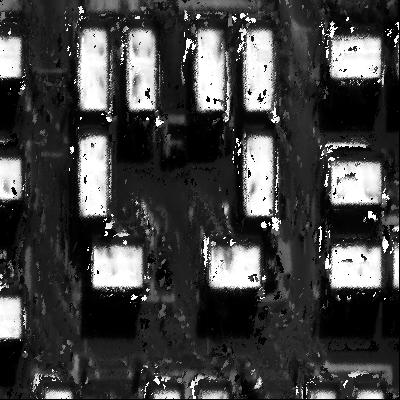
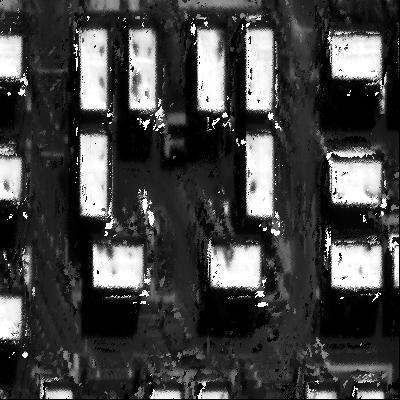
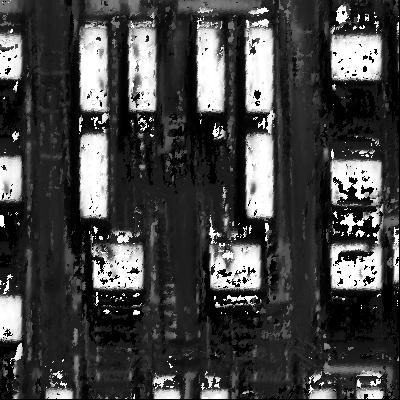
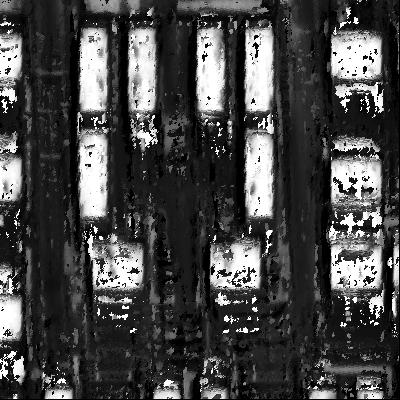
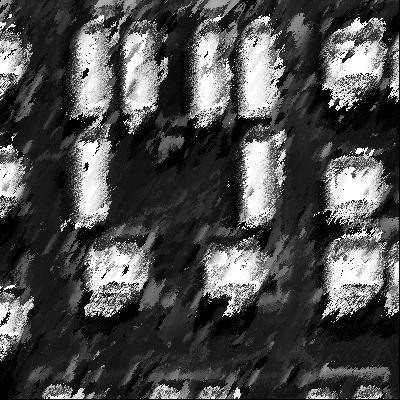
...
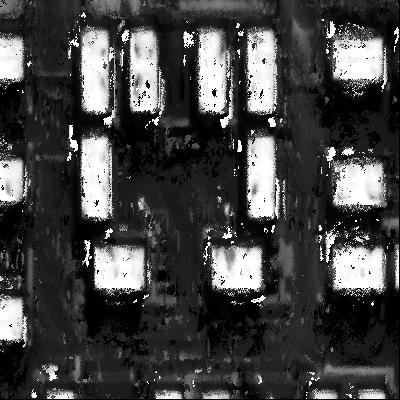
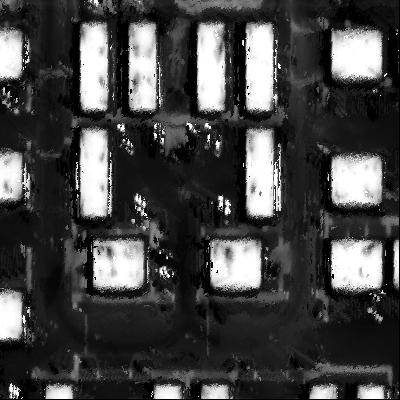
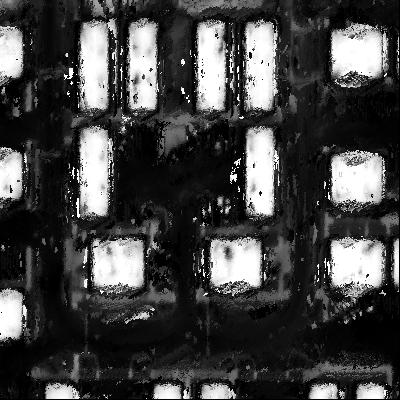
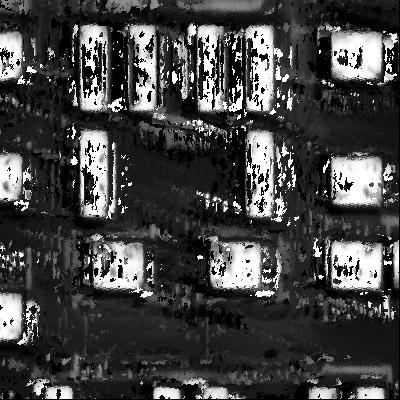
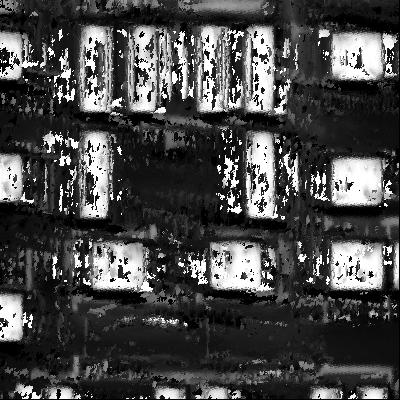

In [46]:
L = []
for (x, y) in zip(ortho1_liste, ortho2_liste) :
    L = L + [utils.simple_equalization_8bit(x), utils.simple_equalization_8bit(y)]
vistools.display_gallery(L)

Affichage des cartes de coût obtenues après PatchMatch...


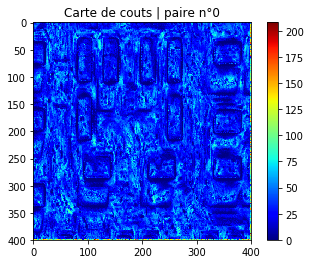

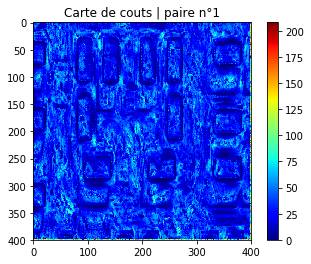

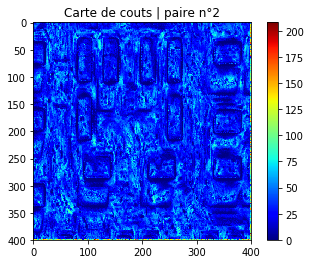

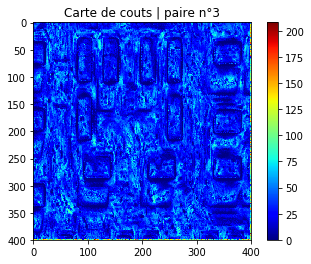

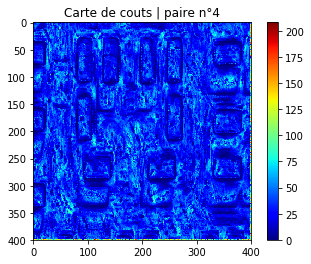

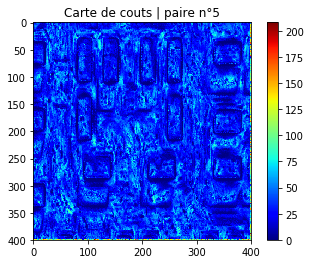

In [48]:
num_fig = 0
print("Affichage des cartes de coût obtenues après PatchMatch...")
for i in range(len(carte_couts_liste)):
    plt.figure(num_fig)
    plt.imshow(carte_couts_liste[0], cmap = plt.cm.jet)      
    plt.colorbar()
    plt.title('Carte de couts | paire n°'+str(i))
    plt.show()
    
    num_fig = num_fig + 1 


Affichage des cartes de hauteur obtenue avec Patch Match en 2D


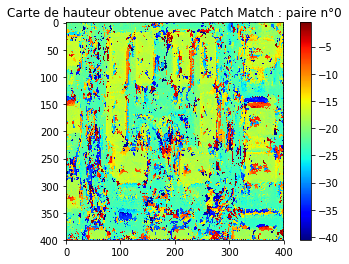

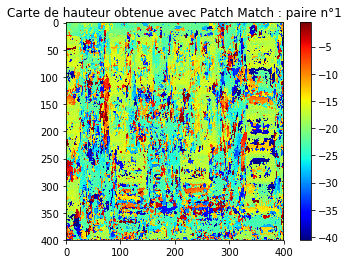

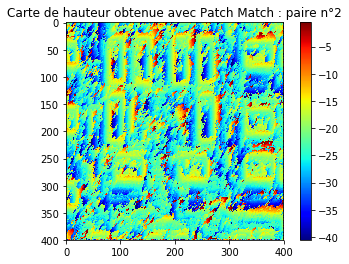

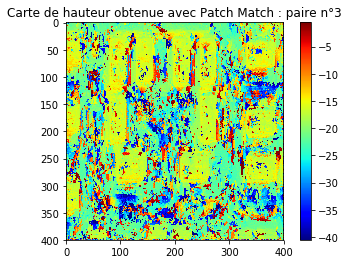

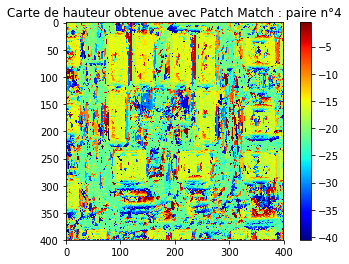

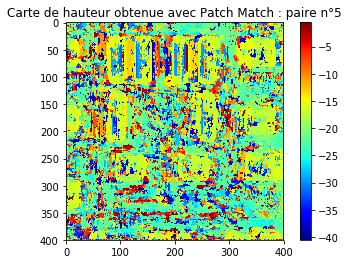

In [49]:
print("Affichage des cartes de hauteur obtenue avec Patch Match en 2D")
for i in range(len(carte_hauteur_liste)):
    plt.figure(num_fig)
    plt.imshow(carte_hauteur_liste[i], cmap = plt.cm.jet)
    plt.colorbar()
    plt.title('Carte de hauteur obtenue avec Patch Match : paire n°'+str(i))
    plt.show()
    
    num_fig = num_fig + 1 

Carte des hauteurs après PatchMatch


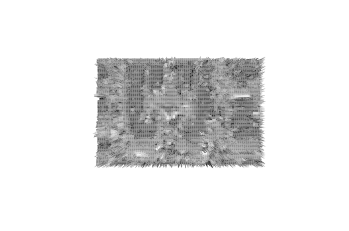

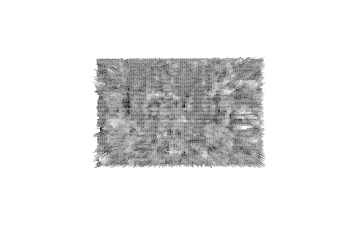

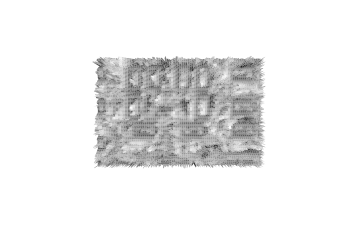

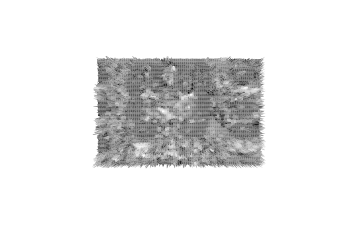

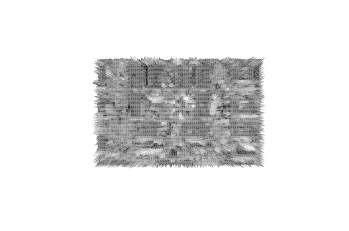

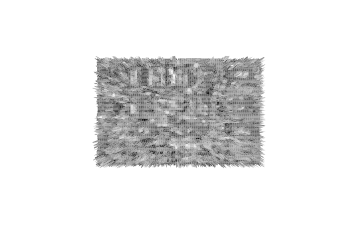

In [51]:
print('Carte des hauteurs après PatchMatch')
for i in range(len(carte_hauteur_liste)):
    plot3d(carte_hauteur_liste[i])

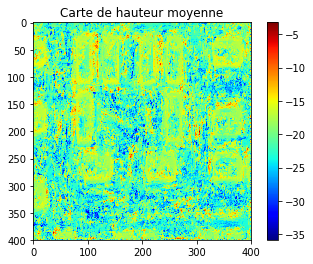

In [52]:
# Pour avoir la carte finale, on calcule la moyenne
carte_hauteur_moyenne = np.mean(np.array(carte_hauteur_liste), axis=0)
carte_couts_moyenne = np.mean(np.array(carte_couts_liste), axis=0)

plt.figure(num_fig)
plt.imshow(carte_hauteur_moyenne, cmap = plt.cm.jet)      
plt.colorbar()
plt.title('Carte de hauteur moyenne')
plt.show()

num_fig = num_fig + 1 

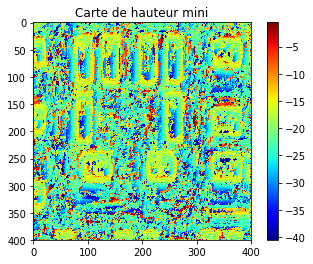

In [53]:
# Pour avoir la carte finale, on calcule le min
idx_mini = np.argmin(carte_couts_liste, axis=0)

carte_hauteur_mini = np.zeros((n, m))
carte_couts_mini = np.zeros((n, m))
for i in range(n):
    for j in range(m):
        carte_couts_mini[i, j] = carte_couts_liste[idx_mini[i, j]][i, j]
        carte_hauteur_mini[i, j] = carte_hauteur_liste[idx_mini[i, j]][i, j]

plt.figure(num_fig)
plt.imshow(carte_hauteur_mini, cmap = plt.cm.jet)      
plt.colorbar()
plt.title('Carte de hauteur mini')
plt.show()

num_fig = num_fig + 1 

In [54]:
# Lissage : supprimer les point dont le cout dépasse un certain seuil (gestion des occlusions)
print('seuil_cout', seuil_cout)

test = (carte_couts_mini<seuil_cout).astype(np.float)
suppressed_points = np.where(test==False)
for i in range(len(suppressed_points[0])):
    test[suppressed_points[0][i], suppressed_points[1][i]] = np.inf

carte_hauteur_lisse = test*carte_hauteur_mini

seuil_cout 50


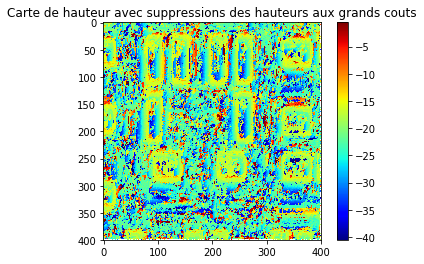

In [55]:
plt.figure(num_fig)
plt.imshow(carte_hauteur_lisse, cmap = plt.cm.jet)  
plt.colorbar()
plt.title('Carte de hauteur avec suppressions des hauteurs aux grands couts')
plt.show()

num_fig = num_fig + 1 

Carte lissée par suppression des couts trop élevés


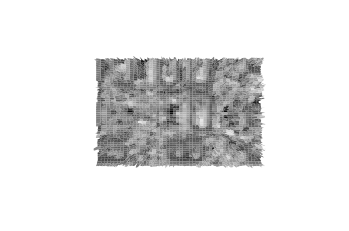

In [56]:
print('Carte lissée par suppression des couts trop élevés')

carte_hauteur_lisse_0 = (carte_hauteur_mini<seuil_cout)*carte_hauteur_mini
plot3d(carte_hauteur_lisse_0[50:-100, 100:-50])

In [62]:
#Supprimer les pics isolé avec le filtre de chatoiement
carte_hauteur_speckle = stereo.specklefilter(carte_hauteur_lisse, 2)

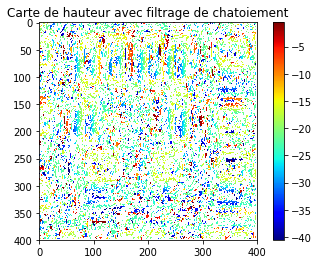

In [63]:
plt.figure(num_fig)
plt.imshow(carte_hauteur_speckle, cmap = plt.cm.jet)
plt.colorbar()
plt.title('Carte de hauteur avec filtrage de chatoiement')
plt.show()

num_fig = num_fig + 1 

In [76]:
#print('Carte lissée avec le filtre de chatoiement')
#plot3d(carte_hauteur_speckle)